# <p style="background-color:yellow; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 10px 100px; color:black; hight:max">  Upvote my work if you found it useful.🎯</p>

# <p style="background-color:yellow; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 10px 100px; color:black; hight:max"> Wait a few seconds until the notebook is ready</p>

------------------------------------------
------------------------------------------
# <p style="background-color:#CCE3F2; font-family:newtimeroman; font-size:175%; text-align:center; border-radius: 15px 50px;">Prediction of Heart Disease using Machine Learning Classification Algorithms 🩺</p>
------------------------------------------
------------------------------------------

<img src="https://www.biospace.com/getasset/ccf44985-b555-4b9e-aa80-891715d5540b/" width=1000 hight=100><br>
  

<b><p style="background-color:skyblue; font-family:newtimeroman; font-size:200%; text-align:center; border-radius: 10px 100px;">Introduction</p>
The objective of this project is to build a model to predict whether a person diagnose a heart disease based on pattern extracted from analysing 14 descriptive features found in Cleveland data set from UCI Machine Learning Repository.<br>
This project consists of three phases:
    <ul>
        <li>Phase I: Focuses on data preprocessing and exploration, as covered in this report.
        <li>Phase II : The model building, validation and prediction are presented. 
        <li>Phase III : Build an interpretability web app to describe the machine learning model using Shapash dashboard.
    </ul>
<b><p style="background-color:skyblue; font-family:newtimeroman; font-size:200%; text-align:center; border-radius: 10px 100px;">We have 13 descriptive features:</p>
<ul><b>
    <li>Age : Age of the patient
    <li>Sex : Sex of the patient
    <li>exang: exercise induced angina (1 = yes; 0 = no)
    <li>ca: number of major vessels (0-3)
    <li>cp : Chest Pain type
        <ul>
            <li>Value 1: typical angina
            <li>Value 2: atypical angina
            <li>Value 3: non-anginal pain
            <li>Value 4: asymptomatic
        </ul>
    <li>trtbps : resting blood pressure (in mm Hg)
    <li>chol : cholestoral in mg/dl fetched via BMI sensor
    <li>oldpeak: ST depression induced by exercise relative to rest 
    <li>fbs : (fasting blood sugar > 120 mg/dl) (1 = true; 0 = false)
    <li>rest_ecg : resting electrocardiographic results
        <ul>
            <li>Value 0: normal
            <li>Value 1: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV)
            <li>Value 2: showing probable or definite left ventricular hypertrophy by Estes' criteria
        </ul>
    <li>thalach : maximum heart rate achieved
    <li>slp : The slope of the peak exercise ST segment with 3 levels:
        <ul>
            <li>Up
            <li>Flat
            <li>Down
        </ul>
    <li>thall: The heart status as retrieved from Thallium test (Categorical with 3 levels-N(normal),FD(fixed defect), RD(reversible defect)
    <li>target : 0= less chance of heart attack 1= more chance of heart attack
    </ul>

<p style="background-color:skyblue; font-family:newtimeroman; font-size:200%; text-align:center; border-radius: 10px 100px;">Outline:</p>
<ul>
    <li><b><a href="#Phase I">Phase I<a/>
        <ul>
            <li><a href="#head-1">Data Pre-processing</a>
            <li><a href="#head-2">Setup and Basic EDA</a>  
                <ul>
                    <li><a href="#head-2-1">Univariate Visualisation</a>
                        <ul>
                            <li><a href="#head-2-1-1">Categorical Features</a>
                                <ul>
                                    <li><a href="#sex">sex column</a>
                                    <li><a href="#cp">cp column</a>
                                    <li><a href="#fbs">fbs column</a>
                                    <li><a href="#restecg">restecg column</a>
                                    <li><a href="#exng">exng column</a>
                                    <li><a href="#slp">slp column</a>
                                    <li><a href="#caa">caa column</a>
                                    <li><a href="#thall">thall column</a>
                                </ul>
                            <li><a href="#head-2-1-2">Numerical Features</a>
                                <ul>
                                    <li><a href="#age">age column</a>
                                    <li><a href="#trtbps">trtbps column</a>
                                    <li><a href="#chol">chol column</a>
                                    <li><a href="#thalachh">thalachh column</a>
                                    <li><a href="#oldpeak">oldpeak column</a>
                                </ul>
                        </ul>
                    <li><a href="#head-2-2">Multivariate Visualisation</a>
                        <ul>
                            <li><a href="#sct_mtx">Scatter Matrix for the data</a>
                            <li><a href="#corr_mtx">Correlation Matrix for the data</a>
                            <li><a href="#thalach_age">Maximum heart rate achieve vs Age</a>
                            <li><a href="#oldpeak_age">ST depression induced by exercise relative to rest vs. Age</a>
                            <li><a href="#trestbps_age">Resting blood pressure-in mm Hg on admission to the hospital</a>
                            <li><a href="#viloin">Violin plots for each column for each target grouped by age</a>
                        </ul>
                </ul>
        </ul>
        <li><b><a href="#Phase II">Phase II:</a></b>
        <ul>
            <li><a href="#prep_ml">Prepare the data for the machine learning model.</a>
            <li><a href="#ml_models">Comparing different Machine learning models.</a>
            </ul>
        <li><b><a href="#Phase III">Phase III:</a></b>
            <ul>
                <li><a href="#shapash">Build an interpretability web app to describe the machine learning model using Shapash dashboard.</a>
            </ul>
           

<h1>Phase I</h1>
<a id="Phase I"></a>

## Data Pre-processing <a class="anchor" id="head-1"></a>

### Importing the Libraries

In [1]:
#main libraries
import os
import pickle
import numpy as np
import pandas as pd
from scipy.stats import loguniform

#visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly 
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.express as px
import plotly.io as pio
from plotly.offline import iplot, init_notebook_mode
import cufflinks as cf

#machine learning libraries:
from sklearn.model_selection import train_test_split, StratifiedKFold, RepeatedStratifiedKFold, KFold, cross_validate, cross_val_score
from sklearn.metrics import accuracy_score,precision_score,recall_score,make_scorer,classification_report
from sklearn.preprocessing  import StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
import eli5 # Feature importance evaluation


# You can go offline on demand by using
cf.go_offline() 

# To connect java script to your notebook
init_notebook_mode(connected=False)

# set some display options:
plt.rcParams['figure.dpi'] = 100
colors = px.colors.qualitative.Prism
pio.templates.default = "plotly_white"

# see our files:
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

### Getting the Data

In [10]:
#import the data
df = pd.read_csv('heart attck.csv')

#make a copy of the original data
df_orig = df.copy()

#show the head of the data
df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3000,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5000,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4000,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8000,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6000,2,0,2,1


In [11]:
#the shape of the data
print('This data contains {} rows and {} columns'.format(df.shape[0],df.shape[1]))

This data contains 303 rows and 14 columns


### Data Exploration/Analysis

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        303 non-null    int64  
 12  thal      303 non-null    int64  
 13  target    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [13]:
#show the types of columns
df.dtypes.to_frame().rename(columns={0:'Column type'})

,Column type
age,int64
sex,int64
cp,int64
trestbps,int64
chol,int64
fbs,int64
restecg,int64
thalach,int64
exang,int64
oldpeak,float64


In [14]:
#find the null values in each column
df.isnull().sum().to_frame().rename(columns={0:'Null values'})

,Null values
age,0
sex,0
cp,0
trestbps,0
chol,0
fbs,0
restecg,0
thalach,0
exang,0
oldpeak,0


In [15]:
#lets take a look to the shape of columns
pd.set_option("display.float", "{:.4f}".format)
df.skew().to_frame().rename(columns={0:'Skewness'}).sort_values('Skewness')

,Skewness
sex,-0.7913
thalach,-0.5374
slope,-0.5083
thal,-0.4767
age,-0.2025
target,-0.1798
restecg,0.1625
cp,0.4847
trestbps,0.7138
exang,0.7425


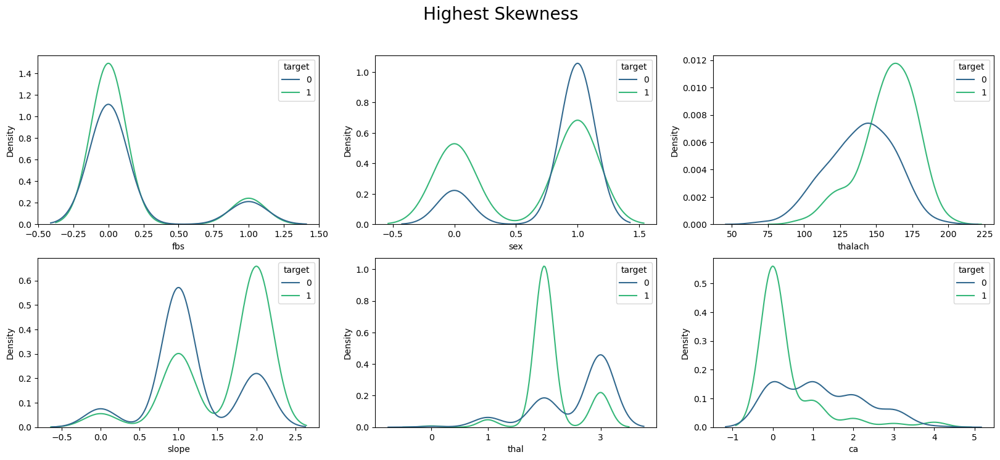

In [16]:
#Visualize columns have highest Skewness
fig, axes = plt.subplots(2,3, figsize=(20, 8));
fig.suptitle('Highest Skewness', fontsize=20);

sns.kdeplot(df['fbs'], ax=axes[0,0],hue=df['target'],palette='viridis');
sns.kdeplot(df['sex'], ax=axes[0,1],hue=df['target'],palette='viridis');
sns.kdeplot(df['thalach'], ax=axes[0,2],hue=df['target'],palette='viridis');
sns.kdeplot(df['slope'], ax=axes[1,0],hue=df['target'],palette='viridis');
sns.kdeplot(df['thal'], ax=axes[1,1],hue=df['target'],palette='viridis');
sns.kdeplot(df['ca'], ax=axes[1,2],hue=df['target'],palette='viridis');

In [17]:
#describe our data
df[df.select_dtypes(exclude='object').columns].describe().\
style.background_gradient(axis=1,cmap=sns.light_palette('green', as_cmap=True))

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


In [18]:
#lets see the correlation between columns and target column
corr = df.corr()['target'].to_frame()
corr = corr.rename(columns={'target':'Correlation with target'})
corr.sort_values(by='Correlation with target',ascending=False)[1:]\
.style.background_gradient(axis=1,cmap=sns.light_palette('Pink', as_cmap=True))

,Correlation with target
cp,0.433798
thalach,0.421741
slope,0.345877
restecg,0.137230
fbs,-0.028046
chol,-0.085239
trestbps,-0.144931
age,-0.225439
sex,-0.280937
thal,-0.344029


<h1>Conclusions</h1><br>
<li>We don't have any null values 
<li>Target column have a higher correlation with:
    <ul>
        <li>exng with <b> -0.436757</b>
        <li>cp with <b>0.433798</b>
        <li>oldpeak with <b>-0.430696</b>
        <li>thalachh with <b>0.421741</b>
        <li>caa	with <b>-0.391724</b>
        <li>thall with <b>-0.344029</b>

# Setup and Basic EDA
<a  id="head-2"></a>

In [19]:
# lets define a function to plot a bar plot easily

def bar_plot(df,x,y,title,colors=None,text=None):
    fig = px.bar(x=x,
                 y=y,
                 text=text,
                 color_discrete_sequence=px.colors.qualitative.Prism,
                 data_frame=df,
                 color=colors,
                 barmode='group',
                 template="simple_white")
    
    texts = [temp[col].values for col in y]
    for i, t in enumerate(texts):
        fig.data[i].text = t
        fig.data[i].textposition = 'inside'

    fig['layout'].title=title

    for trace in fig.data:
        trace.name = trace.name.replace('_',' ').capitalize()

    fig.update_yaxes(tickprefix="", showgrid=True)

    fig.show()

In [20]:
#replace 0 with 'less chance' and 1 value with 'more chance'

df['heart attack'] = df['target'].apply(lambda x: 'more chance' if x==1 else 'less chance')

<h1>Univariate Visualisation</h1><a id='head-2-1'></a>

<h2>Categorical Features</h2><a id='head-2-1-1'></a>

In [21]:
#let explore our columns
print('We have {} columns :\n{}'.format(len(df.columns),df.columns.values))

We have 15 columns :
['age' 'sex' 'cp' 'trestbps' 'chol' 'fbs' 'restecg' 'thalach' 'exang'
 'oldpeak' 'slope' 'ca' 'thal' 'target' 'heart attack']


###### Sex column 
<a id='sex'></a>

In [22]:
temp = pd.DataFrame()
for sex in df['sex'].unique().tolist():
    temp[sex] = df[df['sex']==sex]['heart attack'].value_counts()
    
temp = temp.rename(columns={0:'Female',1:'Male'}).T

fig = make_subplots(rows=2, cols=2, 
                    horizontal_spacing=0.2,
                    specs=[[{"type": "pie",'rowspan':2}, {"type": "bar",'rowspan':2}],
                           [             None          ,             None           ]])

fig.add_trace(go.Pie(labels=temp.columns,
                     sort=False,
                     hole=0.3,
                     showlegend=False,
                     direction='clockwise',
                     domain={'x': [0.15, 0.85], 'y': [0.15, 0.85]},
                     textinfo='label+percent+text',
                     values=temp.loc['Female'].values,
                     textposition='inside',
                     marker={'line': {'color': 'white', 'width': 1.5}},
                     name='Female'),1,1)

fig.add_trace(go.Pie(labels=temp.columns,
                     values=temp.loc['Male'].values,
                     sort=False,
                     showlegend=False,
                     direction='clockwise',
                     textinfo='label+percent+text',
                     domain={'x':[0.1,0.8],'y':[0,1]},
                     hole=0.8,
                     textposition='outside',
                     marker={'line': {'color': 'white', 'width': 1.5}},
                     name='Male'),1,1)


fig.add_trace(go.Bar(x=temp.index,
                     marker_color='salmon',
                     y=temp['less chance'],
                     name='less chance',
                     text=temp['less chance'].values,
                     textposition='auto'),1,2)

fig.add_trace(go.Bar(x=temp.index,
                     y=temp['more chance'],
                     name='more chance',
                     text=temp['more chance'].values,
                     textposition='auto'),1,2)

fig.show()

In [23]:
#lets make Sex column more clear to visualize

temp = pd.DataFrame()
for sex in df['sex'].unique().tolist():
    temp[sex] = df[df['sex']==sex]['heart attack'].value_counts()

temp = temp.rename(columns={0:'Female',1:'Male'}).T.reset_index()
temp['Total sum'] = temp.sum(axis=1)

bar_plot(temp,
         'index',
         ['Total sum','less chance','more chance'],
         title='Heart attack chance by sex')
# temp

<h1>Conclusions</h1><br>
<li>Males are more likely to have a heart disease than Males.

###### cp (Chest Pain type) column
<a id='cp'></a>

In [24]:
temp = pd.DataFrame()
for cp in df['cp'].unique().tolist():
    temp[cp] = df[df['cp']==cp]['heart attack'].value_counts()

temp = temp.T.reset_index()
temp['index'] = pd.Series(['typical angina','atypical angina','non-anginal pain','asymptomatic'])
temp['Total sum'] = temp.sum(axis=1)

bar_plot(temp,
         'index',
         ['Total sum','less chance','more chance'],
         title='Heart attack chance by chest Pain type')

<h1>Conclusions</h1><br>
<li>Most of our samples have a asymptomatic chest pain type.
<li>Patients who have atypical angina are more likely to have heart attack.
<li>Most of the healthy people have a non-anginal chest pain type.

##### fbs (fasting blood sugar > 120 mg/dl) columns
<a id='fbs'></a>

In [25]:
temp = pd.DataFrame()
for fb in df['fbs'].unique().tolist():
    temp[fb] = df[df['fbs']==fb]['heart attack'].value_counts()

temp = temp.T
temp.index = ['fasting blood sugar > 120 mg/dl','fasting blood sugar < 120 mg/dl']
temp['Total sum'] = temp.sum(axis=1)

bar_plot(temp.reset_index(),
         'index',
         ['Total sum','less chance','more chance'],
         title='Heart attack chance by fasting blood sugar test')

<h1>Conclusions</h1><br>
<li>Paple who have fasting blood sugar lower than 120 mg/dl are more likely to have heart attack.
<li>Most of patients have fasting blood sugar lower than 120 mg/dl, compared to patients with low cholestoral level.

##### restecg (Resting electrocardiographic) column
<a id='restecg'></a>

In [26]:

temp = pd.DataFrame()
for rest in df['restecg'].unique().tolist():
    temp[rest] = df[df['restecg']==rest]['heart attack'].dropna().value_counts()

temp.columns = ['Normal','ST-T wave abnormality','Probable left ventricular hypertrophy']
temp = temp.T.reset_index()
temp['Total sum'] = temp.sum(axis=1)

bar_plot(temp,
         'index',
         ['Total sum','less chance','more chance'],
         title='Heart attack chance by Resting electrocardiographic ')

<h1>Conclusions</h1><br>
<li>Most of patients have ST-T wave abnormality and a few of them have Probable left ventricular hypertrophy.
<li>People who have ST-T wave abnormality are more likely to have less heart attack chance than Patients who have Probable left ventricular hypertrophy

###### exng (exercise induced angina) column (1 = yes; 0 = no)
<a id='exng'></a>

In [27]:
temp = pd.DataFrame()
for exng in df['exang'].unique().tolist():
    temp[exng] = df[df['exang']==exng]['heart attack'].value_counts()

temp.columns = ['Exercise induced angina','No exercise induced angina']
temp = temp.T.reset_index()
temp['Total sum'] = temp.sum(axis=1)

bar_plot(temp,
         'index',
         ['Total sum','less chance','more chance'],
         title='Heart attack chance by exercise induced angina')

<h1>Conclusions</h1><br>
<li>People have Exercise induced angina are more likely to have heart attack.
<li>Healthy people with no exercise induced angina have less chance of having a heart attack.
<li>Exercise induced angina reflects a visualised difference for patients with and without heart attack, which means Exercise induced angina may be a major factor to diagnose a heart attack (Total sum is proportional with the chance being have a heart disease)

##### slp (The slope of the peak exercise ST segment) column  (categorical with 3 levels-Up, Flat, Down)
<a id='slp'></a>

In [28]:
df['slope_category'] = df['slope'].replace({0:'Down',1:'Flat',2:'Up'})

temp = pd.DataFrame()
for slp in df['slope_category'].unique().tolist():
    temp[slp] = df[df['slope_category']==slp]['heart attack'].value_counts()

temp = temp.T.reset_index()
temp['Total sum'] = temp.sum(axis=1)

bar_plot(temp,
         'index',
         ['Total sum','less chance','more chance'],
         title='Heart attack chance by the slope of the peak exercise ST segment')

<h1>Conclusions</h1><br>

<li>Most of patient have UP or Flat slope.
<li>Patient who have UP slop are more likely to have heart attack.
<li>The slope of the peak exercise ST segment also reflects a visualised difference for patients with and without heart attack, (Total sum is proportional with the chance being have a heart disease)

##### ca (number of major vessels) column
<a id='ca'></a>

In [29]:
temp = pd.DataFrame()
for c in df['ca'].unique().tolist():
    temp[c] = df[df['ca']==c]['heart attack'].value_counts()

temp = temp.T.reset_index()
temp['Total sum'] = temp.sum(axis=1)

bar_plot(temp,
         'index',
         ['Total sum','less chance','more chance'],
         title='Heart attack chance by the Slope of the number of major vessels')

<h1>Conclusions</h1><br>

<li>Most of people have zero number of number of major vessels.
<li>Patient who have zero number of number of major vessels are more likely to have heart attack.

###### thall column 
<a id='thall'></a>

In [30]:
#thal (The Heart Status as Retrieved from Thallium) column

temp = pd.DataFrame()
for t in df['thal'].unique().tolist():
    temp[t] = df[df['thal']==t]['heart attack'].value_counts()

temp = temp.T.reset_index()
temp['Total sum'] = temp.sum(axis=1)

bar_plot(temp,
         'index',
         ['Total sum','less chance','more chance'],
         title='Heart attack chance by The Heart Status as Retrieved from Thallium')

<h1>Conclusions</h1><br>

<li>Most of people have thal value 2.
<li>Patient who have thal value 2 more likely to have heart attack.

<h2>Numerical Features</h2><a id="head-2-1-2"></a>

##### Age column
<a id='age'></a>

In [31]:
df['age_category'] = pd.cut(df['age'], bins=[0,39,49,59,69,77],labels=["29-39","40-49","50-59","60-69","70-79"]).to_frame()

temp = pd.DataFrame()
for age in df['age_category'].unique().tolist():
    temp[age] = df[df['age_category']==age]['heart attack'].value_counts()

temp = temp.T.reset_index()
temp['Total sum'] = temp.sum(axis=1)

bar_plot(temp,
         'index',
         ['Total sum','less chance','more chance'],
         title='Heart attack chance by age')


fig = make_subplots(rows=2, cols=2,
                    specs=[[{"colspan": 2}, None],
                           [{}, {}]],
                    subplot_titles=('Age Histogram',
                                    '(More chance)',
                                    '(Less chance)'))

fig.add_trace(go.Histogram(x=df['age']),
              row=1, col=1)

fig.add_trace(go.Histogram(x=df[df['heart attack']=='more chance']['age']),
              row=2, col=1)

fig.add_trace(go.Histogram(x=df[df['heart attack']=='less chance']['age']),
              row=2, col=2)

fig.update_layout(showlegend=False, title_text='Histogram for Age')
fig.show()

<h1>Conclusions</h1><br>
<li>Ages vary from 29 years to 77 years. 
<li>Age Histogram negative skewed, meaning that the average age is little lower than the median age.
<li>Most of patients are 50-70 years. 
<li>There is no visualised difference in ages for patients with or without heart attack, which means age may not be a major factor to diagnose a heart attack (it have a correlation value -0.225439 with the output)

##### trtbps (Resting blood pressure) column
<a id='trtbps'></a>

In [32]:
df['trtbps_category'] = pd.cut(df['trestbps'], bins=[0,90,120,200], labels=['Low blood pressure','Ideal blood pressure','High blood pressure'])

temp = pd.DataFrame()
for trtbps in df['trtbps_category'].unique().tolist():
    temp[trtbps] = df[df['trtbps_category']==trtbps]['heart attack'].value_counts()

temp = temp.T.reset_index()
temp['Total sum'] = temp.sum(axis=1)

bar_plot(temp,
         'index',
         ['Total sum','less chance','more chance'],
         title='Heart attack chance by resting blood pressure')



fig = make_subplots(rows=2, cols=2,
                    specs=[[{"colspan": 2}, None],
                           [{}, {}]],
                    subplot_titles=('Resting blood pressure Histogram',
                                    '(More chance)',
                                    '(Less chance)'))

fig.add_trace(go.Histogram(x=df['trestbps']),
              row=1, col=1)

fig.add_trace(go.Histogram(x=df[df['heart attack']=='more chance']['trestbps']),
              row=2, col=1)

fig.add_trace(go.Histogram(x=df[df['heart attack']=='less chance']['trestbps']),
              row=2, col=2)

fig.update_layout(showlegend=False, title_text='Histogram for Resting blood pressure')
fig.show()

<h1>Conclusions</h1><br>
<li>Resting blood pressure is positive skewed, meaning that few patients have high blood pressure.
<li>Also resting blood pressure doesn't reflect any visualised difference for patients with or without heart attack, which means resting blood pressure may not be a major factor to diagnose a heart attack (it have a correlation value -0.144931 with the output)
<li>Most of patients have an extremely higher blood pressure, compared to patients with low blood pressure.

##### chol (cholestoral) column
<a id='chol'></a>

In [33]:
df['chol_category'] = pd.cut(df['chol'], bins=[0,200,239,1000], labels=['Desirable','Borderline high','High'])

temp = pd.DataFrame()
for chol in df['chol_category'].unique().tolist():
    temp[chol] = df[df['chol_category']==chol]['heart attack'].value_counts()

temp = temp.T.reset_index()
temp['Total sum'] = temp.sum(axis=1)

bar_plot(temp,
         'index',
         ['Total sum','less chance','more chance'],
         title='Heart attack chance by cholestoral test')


fig = make_subplots(rows=2, cols=2,
                    specs=[[{"colspan": 2}, None],
                           [{}, {}]],
                    subplot_titles=('Cholestoral Histogram',
                                    '(More chance)',
                                    '(Less chance)'))

fig.add_trace(go.Histogram(x=df['chol']),
              row=1, col=1)

fig.add_trace(go.Histogram(x=df[df['heart attack']=='more chance']['chol']),
              row=2, col=1)

fig.add_trace(go.Histogram(x=df[df['heart attack']=='less chance']['chol']),
              row=2, col=2)

fig.update_layout(showlegend=False, title_text='Histogram for cholestoral')
fig.show()

<h1>Conclusions</h1><br>
<li>Cholestoral is positive skewed, meaning that few patients have high cholestoral.
<li>Most of patients have high cholestoral level, compared to patients with low cholestoral level.

#####  thalachh (Maximum heart rate achieved) column
<a id='thalachh'></a>

In [34]:
# Heart rate depends on age (changes by the age)
# Lets explore each range of age separately

temp = pd.DataFrame(index=[['Average heart rate(target=0)','Average heart rate (target=1)']])
for age in df['age_category'].unique().tolist():
    temp[age] = df[df['age_category']==age][['thalach','heart attack']].groupby('heart attack').mean().astype(int).values

temp.T

,Average heart rate(target=0),Average heart rate (target=1)
60-69,138,145
29-39,152,178
40-49,143,166
50-59,137,157
70-79,127,132


<h1>Conclusions</h1><br>

<li>The average heart rate gets progressively slower as a person moves through childhood toward adolescence.

##### oldpeak (ST Depression Induced by Exercise Relative to Rest) column
<a id='oldpeak'></a>

In [35]:
# oldpeak (ST Depression Induced by Exercise Relative to Rest) column

fig = make_subplots(rows=2, cols=2,
                    specs=[[{"colspan": 2}, None],
                           [{}, {}]],
                    subplot_titles=('OLDPEAK Histogram',
                                    '(More chance)',
                                    '(Less chance)'))

fig.add_trace(go.Histogram(x=df['oldpeak']),
              row=1, col=1)

fig.add_trace(go.Histogram(x=df[df['heart attack']=='more chance']['oldpeak']),
              row=2, col=1)

fig.add_trace(go.Histogram(x=df[df['heart attack']=='less chance']['oldpeak']),
              row=2, col=2)

fig.update_layout(showlegend=False, title_text='Histogram for OLDPEAK')
fig.show()

<h1>Conclusions</h1><br>
<li>The Histogram is highly skewed to the right meaning that most of patient have OLDPEAK values around zero.
<li>OLDPEAK reflects a visualised difference for patients with and without heart attack, which means ST Depression Induced by Exercise Relative to Rest may be a major factor to diagnose a heart attack (it have a correlation value -0.430696 with the output)

In [36]:
#lets add sex_category 
df['sex_category'] = df['sex'].apply(lambda x: 'Male' if x==1 else 'Female')

### Scatter Matrice
<a id='scatter'></a>

<h2>Scatter Matrix</h2>
<a id="sct_mtx"></a>

<Figure size 600x400 with 0 Axes>

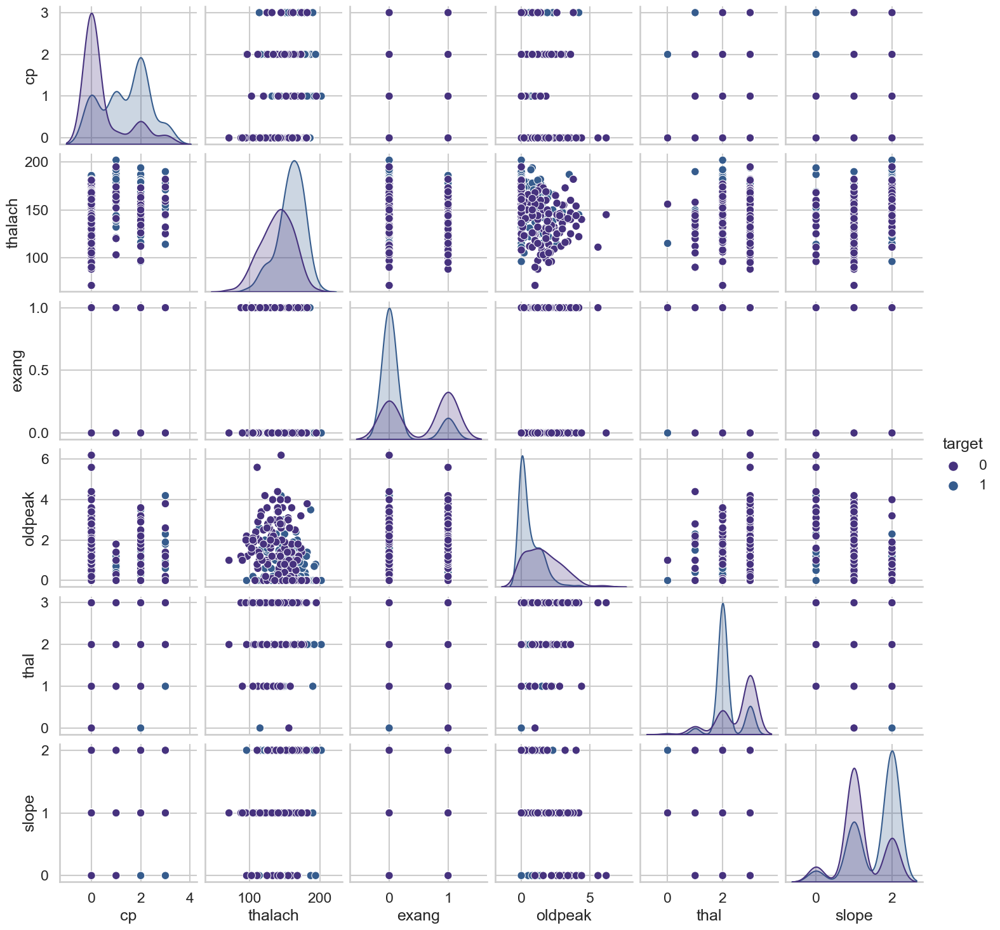

In [37]:
#create a scatter plot for the columns that have a hih correlation with target column
plt.figure();
sns.set(style='whitegrid', context='talk', palette='viridis');
sns.pairplot(data=df[['cp','thalach','exang','oldpeak','thal','slope','target']],
             hue='target');

<h2>Correlation Matrix</h2>
<a id="corr_mtx"></a>

In [38]:
#Correlation Map
corr = df.corr()

corr.iplot(kind='heatmap',
           colorscale='Blues',
           hoverinfo='all',
           layout = go.Layout(title='Correlation Heatmap for the correlation between our columns',
                              titlefont=dict(size=20)))

<h2>Maximum heart rate achieve vs. Age</h2>
<a id="thalach_age"></a>

In [39]:
# Maximum heart rate achieve vs Age
fig = px.scatter(data_frame=df,
                 y='age',
                 x='thalach',
                 color='heart attack')

fig['layout'].update(title='Maximum heart rate achieve vs Age',
                     titlefont=dict(size=20),
                     xaxis=dict(title='Maximum heart rate achieve',titlefont=dict(size=18)),
                     yaxis=dict(title='Age',titlefont=dict(size=18)))

fig.show()

<h2>ST depression induced by exercise relative to rest vs. Age</h2>
<a id="oldpeak_age"></a>

In [40]:
# Maximum heart rate achieve vs Age
fig = px.scatter(data_frame=df,
                 y='age',
                 x='oldpeak',
                 color='heart attack')

fig['layout'].update(title='Maximum heart rate achieve vs Age',
                     titlefont=dict(size=20),
                     xaxis=dict(title='Maximum heart rate achieve',titlefont=dict(size=18)),
                     yaxis=dict(title='Age',titlefont=dict(size=18)))

fig.show()

<h2>Resting blood pressure-in mm Hg on admission to the hospital</h2>
<a id="trestbps_age"></a>

In [41]:
# Resting blood pressure-in mm Hg on admission to the hospital

fig = px.scatter(data_frame=df,
                 y='age',
                 x='trestbps',
                 color='heart attack')

fig['layout'].update(title='Resting blood pressure vs Age',
                     titlefont=dict(size=20),
                     xaxis=dict(title='Resting blood pressure',titlefont=dict(size=18)),
                     yaxis=dict(title='Age',titlefont=dict(size=18)))

fig.show()

<h2>Violin plots for each column for each target grouped by age</h2>
<a id="viloin"></a>

In [42]:
#lets create a function to plot a multi-violin easily

def multi_violin(df,iter_col,dist_col,color_col='survived'):
    if len(df[color_col].unique())!= 2:
        return 'Maximun number of unique values in the color columns is 2'
    i = 0
    data = []
    for ite in df[iter_col]:
        data.append(go.Violin(x=df[df[iter_col]==ite][iter_col],
                              y=df[df[color_col]==df[color_col].unique().tolist()[0]][dist_col],
                              name=str(df[color_col].unique().tolist()[0]),
                              jitter=0,
                              meanline={'visible':True},
                              line={"color": '#F78181'},
                              side='negative',
                              marker=dict(color= '#81F781'),
                              showlegend=(i==0)))

        data.append(go.Violin(x=df[df[iter_col]==ite][iter_col],
                              y=df[df[color_col]==df[color_col].unique().tolist()[1]][dist_col],
                               name=str(df[color_col].unique().tolist()[1]),
                               jitter=0,
                               meanline={'visible':True},
                               line={"color": '#00FF40'},
                               side='positive',
                               marker=dict(color= '#81F781'),
                               showlegend=(i==0)))
        i+=1


    layout = dict(title='Distribution of {} column for each {} colored by {}'.format(dist_col.replace('_',' ').title(),
                                                                                     iter_col.replace('_',' ').title(),
                                                                                     color_col.replace('_',' ').title()),
                  width=1000,height=600,
                  yaxis=dict(title='Distribution',titlefont=dict(size=20)))

    iplot(dict(data=data,layout=layout))    

#### Now lets visualize our continous columns

In [43]:
multi_violin(df=df,iter_col='cp',dist_col='age',color_col='sex_category')

In [44]:
multi_violin(df=df,iter_col='age_category',dist_col='chol',color_col='sex_category')

In [54]:
# multi_violin(df=df,iter_col='age_category',dist_col='trestbps',color_col='sex_category')

In [55]:
# multi_violin(df=df,iter_col='age_category',dist_col='trestbps',color_col='heart attack')

In [56]:
# multi_violin(df=df,iter_col='age_category',dist_col='thalach',color_col='heart attack')

In [57]:
# multi_violin(df=df,iter_col='age_category',dist_col='oldpeak',color_col='sex_category')

<h1>Phase II</h1><a id="Phase II"></a>

<h2>Data Processing</h2>
<h3>Prepare the data for the machine learning models</h3>
<a id="prep_ml"></a>

<p>First, we need to know which numerical features are most important?

In [58]:
#import the data
df = pd.read_csv('heart attck.csv')
#lets see the correlation between columns and target column
corr = df.corr()['target'].to_frame()
corr = corr.rename(columns={'target':'Correlation with target'})
corr.sort_values(by='Correlation with target',ascending=False)[1:]\
.style.background_gradient(axis=1,cmap=sns.light_palette('green', as_cmap=True))

,Correlation with target
cp,0.433798
thalach,0.421741
slope,0.345877
restecg,0.137230
fbs,-0.028046
chol,-0.085239
trestbps,-0.144931
age,-0.225439
sex,-0.280937
thal,-0.344029


From this list it is apparent that :
<li>exng with <b> -0.436757</b>
<li>cp with <b>0.433798</b>
<li>oldpeak with <b>-0.430696</b>
<li>thalachh with <b>0.421741</b>
<li>caa	with <b>-0.391724</b>
<li>thall with <b>-0.344029</b><br>
are the 6 most important numerical features.

<li>Before we proceed into modeling the data we notice that we have cateorical data that LabelEncoded but it will caase some problems.<br>
The problem here is since there are different numbers in the same column, <b>the model will misunderstand the data to be in some kind of order.</b>The model may derive a correlation like as the fbs number increases the chance of being have heart attack increases, <b>but this clearly may not be the scenario in some other data or the prediction set.</b>To overcome this problem, we use <b>One Hot Encoder.</b>

In [ ]:
# first choose columns to train the model with
num_features = ['age','trestbps','chol','thalach','oldpeak']
cat_features = ['cp','slope','thal','sex','exang','ca','fbs','restecg']

# #convert our categorical columns to dummies instead of LabelEncoding
new_data = pd.DataFrame()
new_data[num_features] = df[num_features]

for col in cat_features:
    dumm = pd.get_dummies(df_orig[col], 
                          prefix = col,
                          dtype=float)
    
    new_data = pd.concat([new_data,dumm], axis=1)

#scaling  our numeric columns
std = StandardScaler()
for col in num_features:
    new_data[col] = pd.Series(std.fit_transform(df[col].values.reshape(-1,1)).reshape(-1))

# Separate features and predicted value
X = new_data
y = df['target'].values

<h2>Comparing different Machine learning models</h2>
<a id="ml_models"></a>

In [43]:
# define models to test:
base_models = [("XGB_model", XGBClassifier(random_state=42, n_jobs=-1,use_label_encoder=False)),  #XGBoost model
               ("SVM",      SVC()),                                                               #Support Vector Machines
               ("LR_model", LogisticRegression(random_state=42,n_jobs=-1)),                       #Logistic Regression model
               ("DT_model", DecisionTreeClassifier(random_state=42)),                             #Decision tree model
               ("RF_model", RandomForestClassifier(random_state=42, n_jobs=-1)),                  #Random Forest model
               ("Bagging_model",BaggingClassifier(base_estimator=DecisionTreeClassifier(),        #Bagging model
                                                 max_samples=30,
                                                 n_estimators=500,
                                                 n_jobs=-1,
                                                 bootstrap=True,
                                                 oob_score=True)),
               ("Random_subspaces_model",BaggingClassifier(base_estimator=DecisionTreeClassifier(),#Random subspaces model
                                                           n_estimators=100,
                                                           bootstrap=False,
                                                           max_samples=1.0,
                                                           max_features=True,
                                                           bootstrap_features=True,
                                                           n_jobs=-1)),
                ("Random_Patches_model", BaggingClassifier(base_estimator=DecisionTreeClassifier(),#Random Patches model
                                                            n_estimators=100,
                                                            bootstrap=True,
                                                            max_samples=1.0,
                                                            max_features=True,
                                                            bootstrap_features=True,
                                                            n_jobs=-1)),
                ("AdaBoost_model",AdaBoostClassifier(DecisionTreeClassifier(),                      #AdaBoost model
                                                    n_estimators=100,
                                                    learning_rate=0.01)),
                ("GradientBoosting",GradientBoostingClassifier(max_depth=2,                        #GradientBoosting model
                                                              n_estimators=100))]

<p>To evaluate the performance of any machine learning model we need to test it on some unseen data, based on the models 
performance on unseen data we can say weather our model is :
    <ul>
        <li>Under-fitting.
        <li>Over-fitting.
        <li>Well generalized.
    </ul>
<b>Cross validation (CV)</b> is one of the technique used to test the effectiveness of a machine learning models, it is also a re-sampling procedure used to evaluate a model if we have a limited data.<br>
To perform CV we need to keep aside a sample/portion of the data on which is not used to train the model, later use this sample for testing/validating.<br>
So, k-fold cross validation is used for two main purposes:
<ul>
    <li>To tune hyper parameters.
    <li>To better evaluate the performance of a model.

In [44]:
kfolds = 5   # it is better to be 1/(size of testing test)
split = StratifiedKFold(n_splits=kfolds,
                        shuffle=True, 
                        random_state=42)  # use shuffle to ensure random distribution of data

# Preprocessing, fitting, making predictions and scoring for every model:
models_data = {'min_score':{},'max_score':{},'mean_score':{},'std_dev':{}}
for name, model in base_models:
    # get cross validation score for each model:
    cv_results = cross_val_score(model, 
                                 X, y, 
                                 cv=split,
                                 scoring="accuracy",
                                 n_jobs=-1)
    
    # output:
    #To find the average of all the accuracies.
    min_score = round(min(cv_results), 4)
    models_data['min_score'][name] = min_score
     
    #To find the max accuracy of all the accuracies.
    max_score = round(max(cv_results), 4)
    models_data['max_score'][name] = max_score
    
    #To find the min accuracy of all the accuracies.
    mean_score = round(np.mean(cv_results), 4)
    models_data['mean_score'][name] = mean_score
    
    # let's find the standard deviation of the data to see degree of variance in the results obtained by our model.
    std_dev = round(np.std(cv_results), 4)
    models_data['std_dev'][name] = std_dev
    
    print(f"{name} cross validation accuarcy score: {mean_score} +/- {std_dev} (std) ---> min: {min_score}, max: {max_score}")

XGB_model cross validation accuarcy score: 0.7922 +/- 0.0329 (std) ---> min: 0.7541, max: 0.8333
SVM cross validation accuarcy score: 0.8217 +/- 0.0684 (std) ---> min: 0.7213, max: 0.9344
LR_model cross validation accuarcy score: 0.8648 +/- 0.058 (std) ---> min: 0.7705, max: 0.9508
DT_model cross validation accuarcy score: 0.7323 +/- 0.0489 (std) ---> min: 0.6667, max: 0.8033
RF_model cross validation accuarcy score: 0.8284 +/- 0.0593 (std) ---> min: 0.7377, max: 0.918
Bagging_model cross validation accuarcy score: 0.8316 +/- 0.0627 (std) ---> min: 0.7377, max: 0.9344
Random_subspaces_model cross validation accuarcy score: 0.7689 +/- 0.0514 (std) ---> min: 0.7213, max: 0.8689
Random_Patches_model cross validation accuarcy score: 0.7722 +/- 0.0595 (std) ---> min: 0.7049, max: 0.8689
AdaBoost_model cross validation accuarcy score: 0.7323 +/- 0.0521 (std) ---> min: 0.6667, max: 0.8197
GradientBoosting cross validation accuarcy score: 0.812 +/- 0.0682 (std) ---> min: 0.7049, max: 0.9016


<h3><a href="https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.BaggingClassifier.html">BaggingClassifier</a>:</h3><br>
<li>Bagging and Pasting have the same algorithm, each model is trained using subsets but the way you chose the subsets changes:
<ul>
    <li>In Bagging you do sampling with replacement.
    <li>In Pasting you do sampling without replacement.
</ul>
So two algorithms allow training instances to be sampled several times accroce multiple predictors, but only bagging allows training instances to be sampled several times for the same predictor.
<li>In Bagging we control sampling by <b>(max_sample,Bootstrap).</b>
    Random subspaces and Random Patches are extension to Bagging algorithm, but they do feature sampling instead of instances sampling, they are useful when we have a high dimensions inputs.<br>
<ul>
    <li>In Random subspaces you do sampling to both training and features.
    <li>In Random Patches you keep all training instances <b>(Bootstrap=False, max_sample=1)</b>, but you do sampling feature by <b>(Bootstrap_feature=True)</b>.
</ul>
<h3><a href="https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html">AdaBoostClassifier</a>:</h3><br>
<li>AdaBoost Combines a lot of week learners to make Classification <b>(week learners like stump in DecisionTree)</b>

In [45]:
models_df = pd.DataFrame(models_data).sort_values(by='mean_score',ascending=False)
models_df

,min_score,max_score,mean_score,std_dev
LR_model,0.7705,0.9508,0.8648,0.0580
Bagging_model,0.7377,0.9344,0.8316,0.0627
RF_model,0.7377,0.9180,0.8284,0.0593
SVM,0.7213,0.9344,0.8217,0.0684
GradientBoosting,0.7049,0.9016,0.8120,0.0682
XGB_model,0.7541,0.8333,0.7922,0.0329
Random_Patches_model,0.7049,0.8689,0.7722,0.0595
Random_subspaces_model,0.7213,0.8689,0.7689,0.0514
DT_model,0.6667,0.8033,0.7323,0.0489
AdaBoost_model,0.6667,0.8197,0.7323,0.0521


In [46]:
title = 'Mininam, Maximam and Mean score for each model'

models_df.iplot(kind='bar', title=title)

<h1>Conclusions</h1><br>
<li><b>Logistic Regression Performes better with mean accuracy 95.08% , and standard deviation 5.8%. This values of std is extremely low, which means that our model has a very low variance, which is actually very good since that means that the prediction that we obtained on one test set is not by chance. Rather, the model will perform more or less similar on all test sets as we will see.

In [47]:
accuracies = {}
model = base_models
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
for name,model in base_models:
    model.fit(X_train, y_train)
    acc = model.score(X_test,y_test)*100
    accuracies[name] = acc
    print("{} Accuracy Score : {:.2f}%".format(name,acc))

[19:42:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGB_model Accuracy Score : 83.61%
SVM Accuracy Score : 90.16%
LR_model Accuracy Score : 88.52%
DT_model Accuracy Score : 81.97%
RF_model Accuracy Score : 88.52%
Bagging_model Accuracy Score : 86.89%
Random_subspaces_model Accuracy Score : 85.25%
Random_Patches_model Accuracy Score : 80.33%
AdaBoost_model Accuracy Score : 83.61%
GradientBoosting Accuracy Score : 83.61%


In [48]:
models_res = pd.DataFrame(data=accuracies.items())
models_res.columns = ['Model','Test score']
models_res.sort_values('Test score',ascending=False)

,Model,Test score
1,SVM,90.1639
2,LR_model,88.5246
4,RF_model,88.5246
5,Bagging_model,86.8852
6,Random_subspaces_model,85.2459
0,XGB_model,83.6066
8,AdaBoost_model,83.6066
9,GradientBoosting,83.6066
3,DT_model,81.9672
7,Random_Patches_model,80.3279


In [49]:
new_model_df = models_df.join(models_res.set_index('Model'))
new_model_df['Test Score - Cross_Validation Score'] = new_model_df['Test score'] - new_model_df['mean_score']*100
new_model_df.sort_values('Test Score - Cross_Validation Score',ascending=True)

,min_score,max_score,mean_score,std_dev,Test score,Test Score - Cross_Validation Score
LR_model,0.7705,0.9508,0.8648,0.0580,88.5246,2.0446
GradientBoosting,0.7049,0.9016,0.8120,0.0682,83.6066,2.4066
Random_Patches_model,0.7049,0.8689,0.7722,0.0595,80.3279,3.1079
Bagging_model,0.7377,0.9344,0.8316,0.0627,86.8852,3.7252
XGB_model,0.7541,0.8333,0.7922,0.0329,83.6066,4.3866
RF_model,0.7377,0.9180,0.8284,0.0593,88.5246,5.6846
SVM,0.7213,0.9344,0.8217,0.0684,90.1639,7.9939
Random_subspaces_model,0.7213,0.8689,0.7689,0.0514,85.2459,8.3559
DT_model,0.6667,0.8033,0.7323,0.0489,81.9672,8.7372
AdaBoost_model,0.6667,0.8197,0.7323,0.0521,83.6066,10.3766


<h1>Conclusions</h1><br>
<b><li>Logistic Regression Performes more better with all test sets which is perfect !!
   <li>Difference between cross validation score and test score is lower 
    <br><h3>Lets try to improve the model using grid search</h3>

In [50]:
model = LogisticRegression()

# define grid search
grid = dict(solver=['newton-cg', 'lbfgs', 'liblinear'],
            penalty=['l2'],
            C=np.linspace(0, 4, 50))

clf = GridSearchCV(model, 
                   grid, 
                   cv=split,
                   verbose = False,
                   n_jobs=-1)
best_model = clf.fit(X_train, y_train)
best_parms = best_model.best_estimator_.get_params()

print('Best C : {}'.format(best_parms['C']))
print('Best solver : {}'.format(best_parms['solver']))   

Best C : 0.24489795918367346
Best solver : newton-cg


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning:

One or more of the test scores are non-finite: [       nan        nan        nan 0.83069728 0.83069728 0.83069728
 0.83894558 0.83894558 0.83894558 0.84311224 0.84311224 0.84311224
 0.84311224 0.84311224 0.84311224 0.84311224 0.84311224 0.84311224
 0.84311224 0.84311224 0.84311224 0.84311224 0.84311224 0.84311224
 0.83903061 0.83903061 0.83903061 0.83903061 0.83903061 0.83903061
 0.83903061 0.83903061 0.83903061 0.83903061 0.83903061 0.83903061
 0.83486395 0.83486395 0.83486395 0.83486395 0.83486395 0.83486395
 0.83486395 0.83486395 0.83486395 0.83486395 0.83486395 0.83486395
 0.83486395 0.83486395 0.83486395 0.83486395 0.83486395 0.83486395
 0.83486395 0.83486395 0.83486395 0.83486395 0.83486395 0.83486395
 0.83486395 0.83486395 0.83486395 0.83486395 0.83486395 0.83486395
 0.83486395 0.83486395 0.83486395 0.83486395 0.83486395 0.83486395
 0.83486395 0.83486395 0.83486395 0.83486395 0.83486395 

In [51]:
lr_model = LogisticRegression(C=best_parms['C'],
                             solver=best_parms['solver'])

lr_model.fit(X_train, y_train)

acc = lr_model.score(X_test, y_test)*100

print("Test Accuracy {:.2f}%".format(acc))

Test Accuracy 90.16%


<b>That's better !!!

In [52]:
#save the model in Pickle File

pickle.dump(lr_model, open('lr_model.sav', 'wb'))

### Lets try  KNN algorithms

In [53]:
from sklearn.cluster import KMeans

k = []
for i in range(1,20):
    knn = KNeighborsClassifier(n_neighbors = i)
    knn.fit(X_train, y_train)
    score = knn.score(X_test, y_test)
    k.append(score)
    
knn_df = pd.DataFrame(columns=['Score'],index=list(range(1,20)),data=k)

In [54]:
title = 'KNeighbor model score for number of neighbors from 1 to 20'
fig = px.line(data_frame=knn_df.reset_index(),
              title = title,
              x='index', y='Score')
fig.show()

<b>So the best Kneighbor model will be achieved with number of neighbors 8

In [55]:
best_knn = KNeighborsClassifier(8)
best_knn.fit(X_train, y_train)
score = best_knn.score(X_test, y_test)*100
print("Test Accuracy {:.2f}%".format(score))

Test Accuracy 91.80%


In [56]:
#save the model in Pickle File

pickle.dump(best_knn, open('knn.sav', 'wb'))

<b>Better than LogisticRegression !!